In [1]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, GRU, Dense, Input, Conv1D, MaxPooling1D, Flatten, Bidirectional, ConvLSTM2D, BatchNormalization, Attention, Add
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

2024-10-14 10:38:26.329484: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-14 10:38:26.329609: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-14 10:38:26.464357: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Load the dataset
df = pd.read_csv('/kaggle/input/gait-conc-dataset/Gaavya.csv')

In [3]:
# Check for NaN or infinite values and handle them
df = df.ffill().bfill()  # Forward fill then backward fill for any remaining NaNs
df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace infinite values with NaNs
df.dropna(inplace=True)  # Drop any remaining NaNs

# Normalize the data
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df)

print(np.min(data_scaled), np.max(data_scaled))  # Check the range of scaled data


0.0 1.0000000000000002


In [4]:
# Create sequences
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        seq = data[i:i + seq_length]
        target = data[i + seq_length]
        sequences.append((seq, target))
    return sequences

seq_length = 10
sequences = create_sequences(data_scaled, seq_length)

In [5]:
X = np.array([seq[0] for seq in sequences])
y = np.array([seq[1] for seq in sequences])

print(X.shape, y.shape)  # Check the shapes of X and y
print(np.isnan(X).sum(), np.isnan(y).sum())  # Check for NaNs in sequences
print(np.isinf(X).sum(), np.isinf(y).sum())  # Check for infinite values in sequences

# Split into training and testing sets
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Reshape the data for ConvLSTM
X_train_conv = X_train.reshape((X_train.shape[0], X_train.shape[1], 1, 1, X_train.shape[2]))
X_test_conv = X_test.reshape((X_test.shape[0], X_test.shape[1], 1, 1, X_test.shape[2]))

input_features = X_train.shape[2]
print(f'Number of features provided to the model: {input_features}')
output_features = y_train.shape[1]
print(f'Number of features being predicted by the model: {output_features}')

(10867, 10, 36) (10867, 36)
0 0
0 0
Number of features provided to the model: 36
Number of features being predicted by the model: 36


In [6]:
# # # Build LSTM model
# # model = Sequential()
# # model.add(Input(shape=(seq_length, X.shape[2])))
# # model.add(LSTM(50, return_sequences=True))
# # model.add(LSTM(50))
# # model.add(Dense(y.shape[1]))

# # model.compile(optimizer='adam', loss='mse')
# # model.summary()
# # Function to create LSTM model
# def create_lstm_model(input_shape):
#     model = Sequential()
#     model.add(LSTM(50, activation='tanh', return_sequences=True, input_shape=input_shape))
#     model.add(LSTM(50, activation='tanh'))
#     model.add(Dense(input_shape[-1]))
#     optimizer = Adam(learning_rate=0.001, clipnorm=1.0)  # Gradient clipping
#     model.compile(optimizer=optimizer, loss='mse')
#     return model

# input_shape = (X_train.shape[1], X_train.shape[2])
# model = create_lstm_model(input_shape)
# model.summary()

# Function to create the LSTM model
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(LSTM(50, activation='tanh'))
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001, clipnorm=1.0), loss='mse')
    return model

# 1D CNN model
def create_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

# Hybrid CNN-LSTM model
def create_cnn_lstm_model(input_shape):
    model = Sequential()
    model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(50, activation='tanh', return_sequences=False))
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

# Bidirectional LSTM model
def create_bidirectional_lstm_model(input_shape):
    model = Sequential()
    model.add(Bidirectional(LSTM(50, activation='tanh', return_sequences=True), input_shape=input_shape))
    model.add(Bidirectional(LSTM(50, activation='tanh')))
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

# GRU model
def create_gru_model(input_shape):
    model = Sequential()
    model.add(GRU(50, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(GRU(50, activation='tanh'))
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001, clipnorm=1.0), loss='mse')
    return model

# Corrected ConvLSTM model
def create_convlstm_model(input_shape):
    model = Sequential()
    model.add(ConvLSTM2D(filters=64, kernel_size=(1, 1), activation='relu',
                         input_shape=(input_shape[0], 1, 1, input_shape[1]),
                         return_sequences=True))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dense(input_shape[-1]))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model
# LSTM with Attention model
def create_lstm_attention_model(input_shape):
    inputs = Input(shape=input_shape)
    lstm_out = LSTM(50, return_sequences=True)(inputs)
    attention_out = Attention()([lstm_out, lstm_out])
    add_out = Add()([lstm_out, attention_out])
    lstm_out2 = LSTM(50)(add_out)
    outputs = Dense(input_shape[-1])(lstm_out2)
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.001, clipnorm=1.0), loss='mse')
    return model



In [7]:
# Prepare input shape
input_shape = (X_train.shape[1], X_train.shape[2])

# Initialize models
lstm_model = create_lstm_model(input_shape)
lstm_model.summary()
cnn_model = create_cnn_model(input_shape)
cnn_model.summary()
cnn_lstm_model = create_cnn_lstm_model(input_shape)
cnn_lstm_model.summary()
bidirectional_lstm_model = create_bidirectional_lstm_model(input_shape)
bidirectional_lstm_model.summary()
gru_model = create_gru_model(input_shape)
gru_model.summary()
convlstm_model = create_convlstm_model(input_shape)
convlstm_model.summary()
lstm_attention_model = create_lstm_attention_model(input_shape)
lstm_attention_model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 10, 50)         │        17,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 36)             │         1,836 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,436 (154.05 KB)

 Trainable params: 39,436 (154.05 KB)

 Non-trainable params: 0 (0.00 B)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 8, 64)          │         6,976 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │        12,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 36)             │         1,836 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,662 (84.62 KB)

 Trainable params: 21,662 (84.62 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)               │ (None, 8, 64)          │         6,976 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 50)             │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 36)             │         1,836 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,812 (124.27 KB)

 Trainable params: 31,812 (124.27 KB)

 Non-trainable params: 0 (0.00 B)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 10, 100)        │        34,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 100)            │        60,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 36)             │         3,636 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 98,836 (386.08 KB)

 Trainable params: 98,836 (386.08 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 10, 50)         │        13,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 50)             │        15,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 36)             │         1,836 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,336 (118.50 KB)

 Trainable params: 30,336 (118.50 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 10, 1, 1, 64)   │        25,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 10, 1, 1, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 640)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 36)             │        23,076 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,188 (192.14 KB)

 Trainable params: 49,060 (191.64 KB)

 Non-trainable params: 128 (512.00 B)

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 10, 36)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 10, 50)    │     17,400 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention           │ (None, 10, 50)    │          0 │ lstm_5[0][0],     │
│ (Attention)         │                   │            │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 10, 50)    │          0 │ lstm_5[0][0],     │
│                     │                   │            │ attention[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 50)        │     20,200 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 36)        │      1,836 │ lstm_6[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 39,436 (154.05 KB)

 Trainable params: 39,436 (154.05 KB)

 Non-trainable params: 0 (0.00 B)

In [8]:
lstm_history = lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0284 - val_loss: 0.0020
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0034 - val_loss: 0.0014
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0022 - val_loss: 8.0261e-04
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0016 - val_loss: 6.8621e-04
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0013 - val_loss: 5.3346e-04
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0010 - val_loss: 4.2150e-04
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 8.9832e-04 - val_loss: 3.5951e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 7.7931e-04 - val_loss: 3.3809e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 6.9107e-04 - val_loss: 2.6631e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.7899e-04 - val_loss: 2.3317e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.2661e-04 - val_loss: 2.3765

In [9]:
cnn_history = cnn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
107/218 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0879

I0000 00:00:1728902393.149538      73 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0568 - val_loss: 0.0029
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0041 - val_loss: 0.0014
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0028 - val_loss: 0.0012
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0019 - val_loss: 0.0010
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0015 - val_loss: 9.9638e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0015 - val_loss: 9.4195e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0014 - val_loss: 8.3235e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0012 - val_loss: 7.5274e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0011 - val_loss: 7.7423e-04
Epoch 12/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s

In [10]:
cnn_lstm_history = cnn_lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0295 - val_loss: 0.0023
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0022 - val_loss: 8.9166e-04
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0016 - val_loss: 6.6040e-04
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0013 - val_loss: 5.4638e-04
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0011 - val_loss: 4.2865e-04
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 9.4283e-04 - val_loss: 3.9584e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 8.1673e-04 - val_loss: 3.4657e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 6.7250e-04 - val_loss: 3.0915e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 6.3927e-04 - val_loss: 2.8403e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 5.9005e-04 - val_loss: 3.4585e

In [11]:
bidirectional_lstm_history = bidirectional_lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0305 - val_loss: 0.0014
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0021 - val_loss: 6.3483e-04
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0012 - val_loss: 4.5892e-04
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 9.4041e-04 - val_loss: 4.2666e-04
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 7.7882e-04 - val_loss: 3.3302e-04
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 6.5682e-04 - val_loss: 4.6814e-04
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.8297e-04 - val_loss: 2.0572e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.0176e-04 - val_loss: 2.4237e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 4.0152e-04 - val_loss: 2.1086e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 4.0588e-04 - val_loss: 1.6923e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 3.5893e-04 -

In [12]:
gru_history = gru_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0430 - val_loss: 0.0022
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0033 - val_loss: 0.0013
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0020 - val_loss: 8.2727e-04
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0014 - val_loss: 5.6767e-04
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0010 - val_loss: 4.3412e-04
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 7.9931e-04 - val_loss: 3.4859e-04
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 6.1359e-04 - val_loss: 2.9018e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.0432e-04 - val_loss: 2.5823e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4.2841e-04 - val_loss: 1.8506e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.7348e-04 - val_loss: 1.6348e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.1202e-04 - val_loss: 1.3

In [13]:
convlstm_history = convlstm_model.fit(X_train_conv, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0793 - val_loss: 0.0847
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0026 - val_loss: 0.0222
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0019 - val_loss: 0.0043
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0018 - val_loss: 0.0025
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0015 - val_loss: 0.0032
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0013 - val_loss: 0.0039
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0012 - val_loss: 0.0026
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0011 - val_loss: 0.0027
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 9.8491e-04 - val_loss: 0.0031
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0011 - val_loss: 0.0032
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 8.7818e-04 - val_loss: 0.0036
Epoch 12/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s

In [14]:
lstm_attention_history = lstm_attention_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0310 - val_loss: 0.0018
Epoch 2/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0034 - val_loss: 0.0012
Epoch 3/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0020 - val_loss: 9.2125e-04
Epoch 4/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0016 - val_loss: 7.0164e-04
Epoch 5/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0013 - val_loss: 6.0894e-04
Epoch 6/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0010 - val_loss: 4.6757e-04
Epoch 7/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 9.1280e-04 - val_loss: 4.6660e-04
Epoch 8/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 8.0719e-04 - val_loss: 2.6907e-04
Epoch 9/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 6.8942e-04 - val_loss: 2.7281e-04
Epoch 10/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.8378e-04 - val_loss: 2.5023e-04
Epoch 11/50
218/218 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.2846e-04 - val_loss: 2.4545e

In [15]:
# # Train the model
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)


In [16]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error
# # Make predictions
# predictions = model.predict(X_test)

# # Inverse transform the predictions
# predictions_inverse = scaler.inverse_transform(predictions)
# mse = mean_squared_error(y_test, predictions)
# mae = mean_absolute_error(y_test, predictions)
# print(f'Mean Squared Error: {mse}')
# print(f'Mean Absolute Error: {mae}')
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# Evaluate models
def evaluate_model(model, X_test, y_test, scaler, model_name):
    predictions = model.predict(X_test)
    predictions_inverse = scaler.inverse_transform(predictions)
#     print(X_test.shape)
#     print(predictions.shape)
#     print(predictions_inverse.shape)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f'{model_name} - Mean Squared Error: {mse}')
    print(f'{model_name} - Mean Absolute Error: {mae}')
    return predictions_inverse

# Plot results
def plot_predictions(y_test_inverse, predictions_inverse, feature_index, model_name):
    plt.figure(figsize=(14, 7))
    plt.plot(y_test_inverse[:, feature_index], label='True Values')
    plt.plot(predictions_inverse[:, feature_index], label=f'{model_name} Predictions')
    plt.xlabel('Time')
    plt.ylabel('X (m/s2)_LK')
    plt.title(f'True Values vs {model_name} Predictions for X (m/s2)_LK')
    plt.legend()
    plt.show()
    
# Inverse transform y_test
y_test_inverse = scaler.inverse_transform(y_test)

In [17]:
# Evaluate and plot for each model
lstm_predictions = evaluate_model(lstm_model, X_test, y_test, scaler, 'LSTM')
cnn_predictions = evaluate_model(cnn_model, X_test, y_test, scaler, '1D CNN')
cnn_lstm_predictions = evaluate_model(cnn_lstm_model, X_test, y_test, scaler, 'Hybrid CNN-LSTM')
bidirectional_lstm_predictions = evaluate_model(bidirectional_lstm_model, X_test, y_test, scaler, 'Bidirectional LSTM')
gru_predictions = evaluate_model(gru_model, X_test, y_test, scaler, 'GRU')
convlstm_predictions = evaluate_model(convlstm_model, X_test_conv, y_test, scaler, 'ConvLSTM')
lstm_attention_predictions = evaluate_model(lstm_attention_model, X_test, y_test, scaler, 'LSTM with Attention')


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
LSTM - Mean Squared Error: 3.733541190483961e-05
LSTM - Mean Absolute Error: 0.004859781795830714
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
1D CNN - Mean Squared Error: 9.523021967495949e-05
1D CNN - Mean Absolute Error: 0.007715005780266813
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Hybrid CNN-LSTM - Mean Squared Error: 0.00014120710181175937
Hybrid CNN-LSTM - Mean Absolute Error: 0.008445753922168465
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Bidirectional LSTM - Mean Squared Error: 2.8019471582285145e-05
Bidirectional LSTM - Mean Absolute Error: 0.004407336696092925
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
GRU - Mean Squared Error: 3.041321416514666e-05
GRU - Mean Absolute Error: 0.0043254168629312285
68/68 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
ConvLSTM - Mean Squared Error: 0.0006701324533460258
ConvLSTM - Mean Absolute Error: 0.020520209721924
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
LSTM with Attention - Mean Squared Error: 4.423747865270242e-05
LSTM with Atte

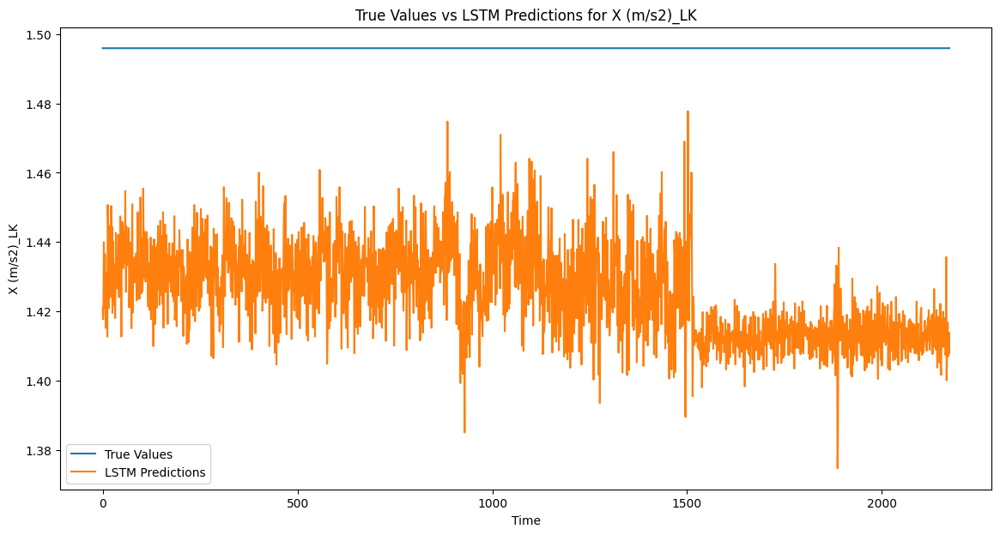

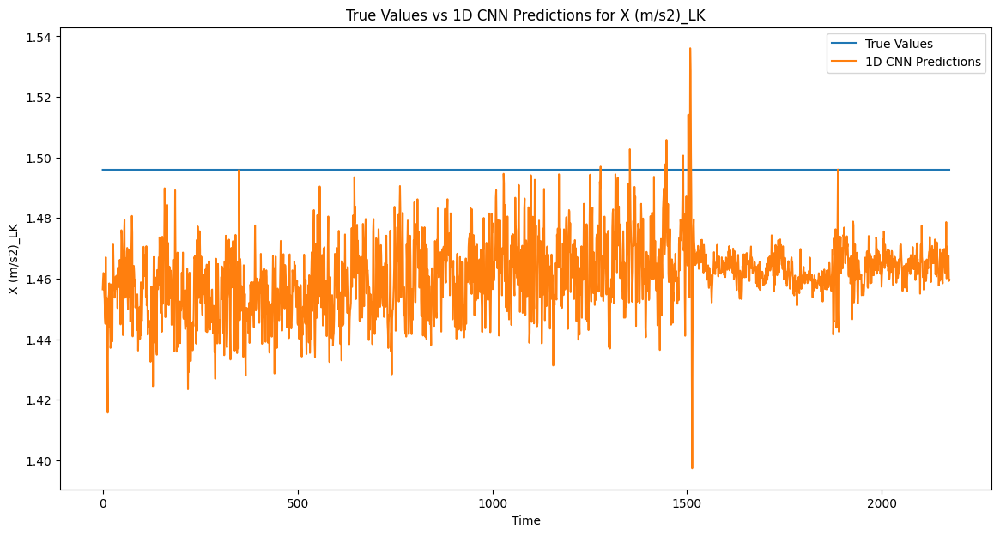

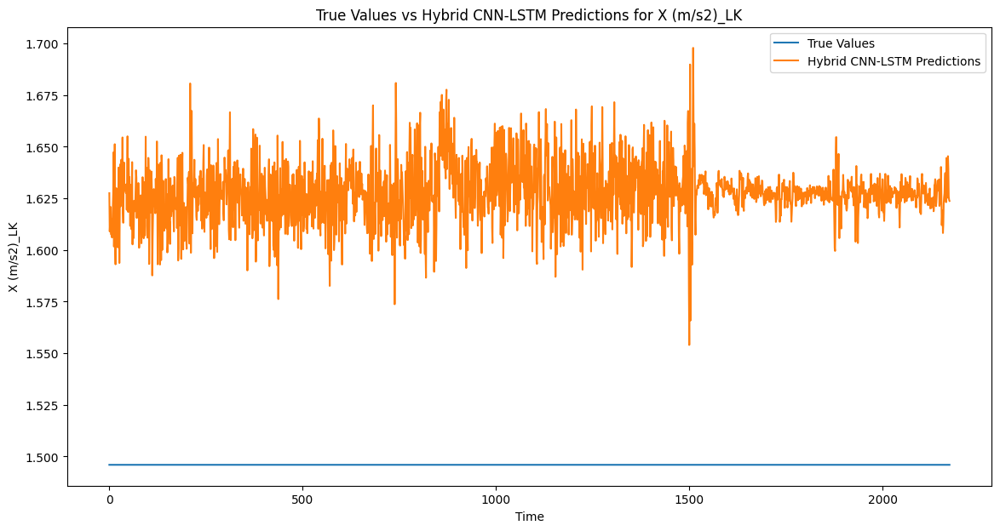

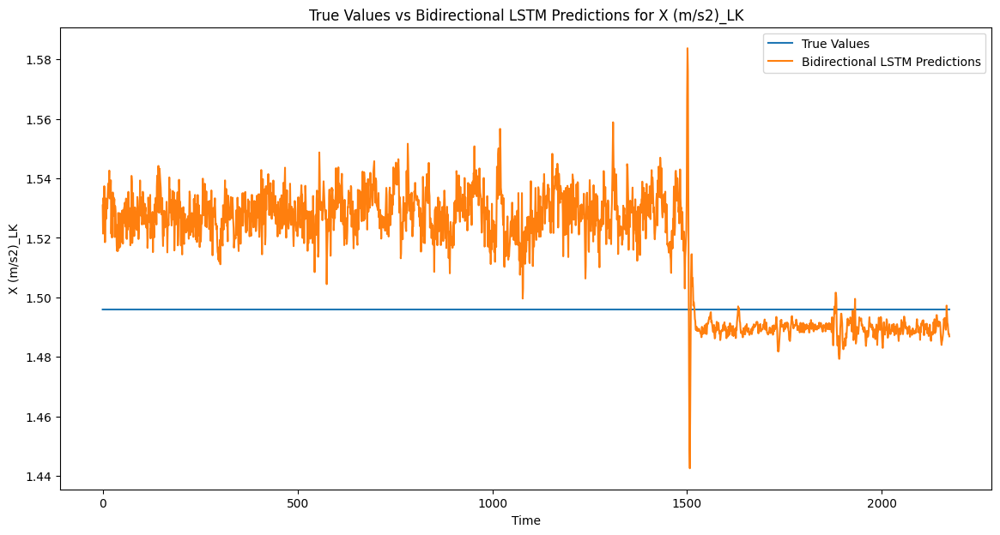

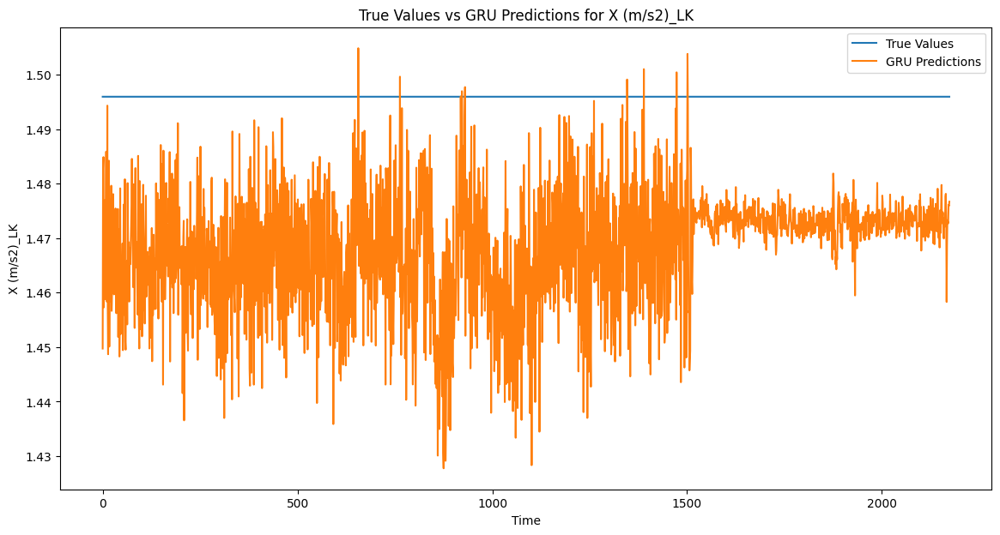

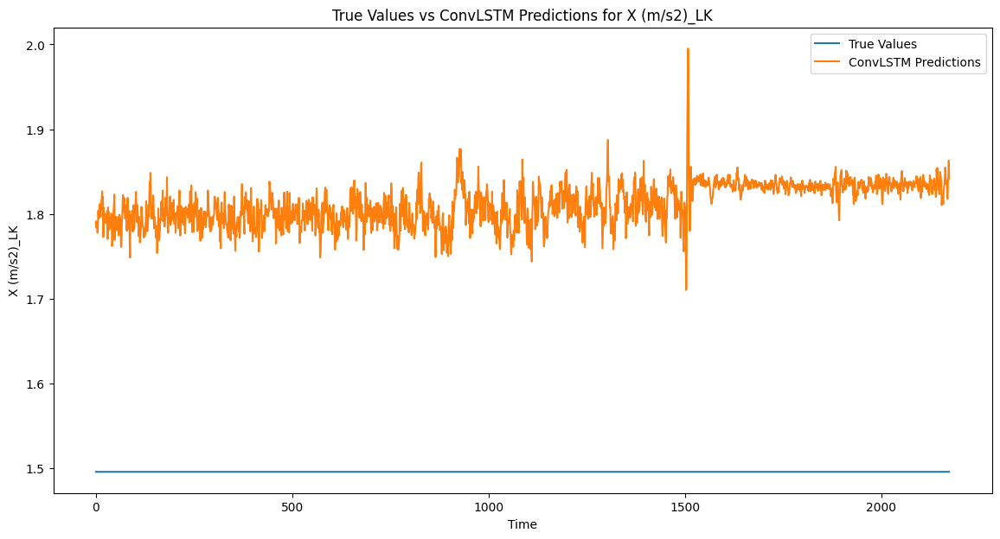

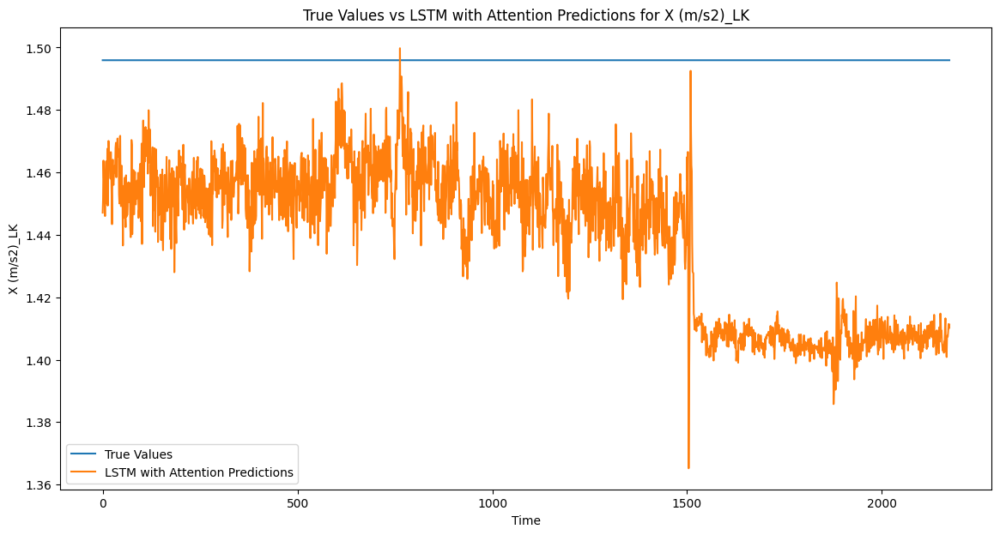

In [18]:
# Plot predictions
feature_index = 0  # Choose the feature to plot
plot_predictions(y_test_inverse, lstm_predictions, feature_index, 'LSTM')
plot_predictions(y_test_inverse, cnn_predictions, feature_index, '1D CNN')
plot_predictions(y_test_inverse, cnn_lstm_predictions, feature_index, 'Hybrid CNN-LSTM')
plot_predictions(y_test_inverse, bidirectional_lstm_predictions, feature_index, 'Bidirectional LSTM')
plot_predictions(y_test_inverse, gru_predictions, feature_index, 'GRU')
plot_predictions(y_test_inverse, convlstm_predictions, feature_index, 'ConvLSTM')
plot_predictions(y_test_inverse, lstm_attention_predictions, feature_index, 'LSTM with Attention')


In [19]:
# Check the shapes of y_test and predictions
# print("Shape of y_test:", y_test.shape)
# print("Shape of predictions:", predictions.shape)

In [20]:
# import matplotlib.pyplot as plt

# # Assuming predictions and y_test are inverse transformed already
# # If not, inverse transform them
# y_test_inverse = scaler.inverse_transform(y_test)

# # Select a feature to plot (e.g., the first feature)
# feature_index = 0

# # Plot the true values
# plt.figure(figsize=(14, 7))
# plt.plot(y_test_inverse[:, feature_index], label='True Values')
# # Plot the predicted values
# plt.plot(predictions_inverse[:, feature_index], label='Predictions')
# plt.xlabel('Time')
# plt.ylabel('Value')
# plt.title('True Values vs Predictions')
# plt.legend()
# plt.show()


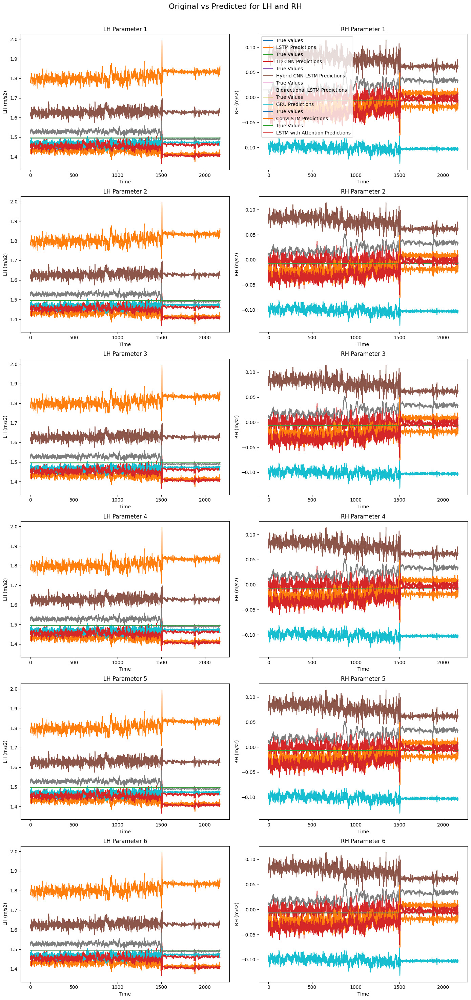

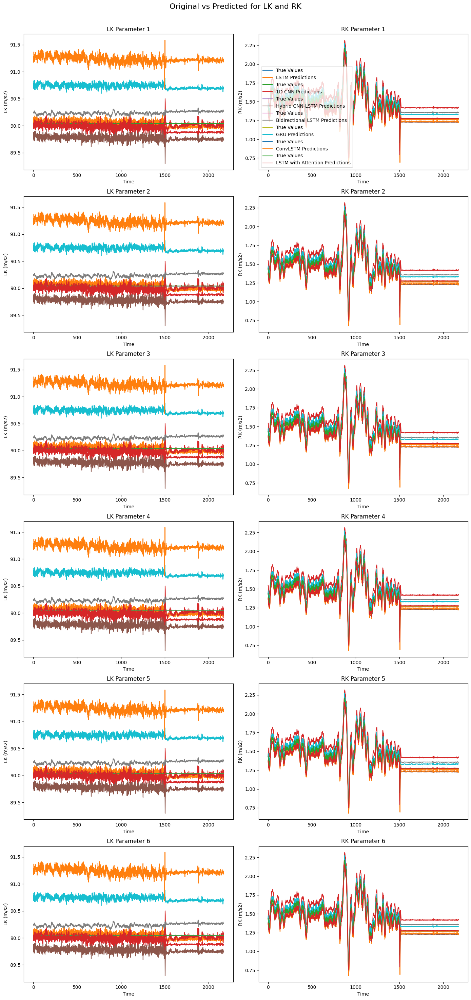

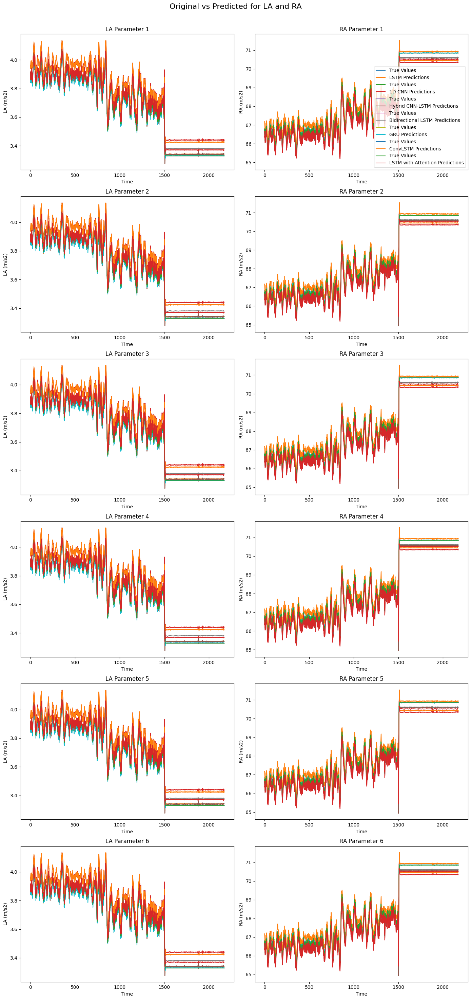

In [21]:
import matplotlib.pyplot as plt

# Function to plot predictions for different joints
def plot_joint_predictions(models_predictions, y_test_inverse, feature_names, model_names):
    """
    models_predictions: List of predictions from different models (e.g. [lstm_predictions, cnn_predictions, ...])
    y_test_inverse: Inverse transformed ground truth values for testing data
    feature_names: List of feature names (e.g. ['X_LH', 'X_RH', 'Y_LH', ...])
    model_names: List of model names corresponding to the predictions
    """
    
    # Create a 6x2 figure (rows for each parameter, columns for LH-RH, LK-RK, LA-RA)
    joint_pairs = [['LH', 'RH'], ['LK', 'RK'], ['LA', 'RA']]  # Columns for each figure
    feature_indices = {
        'LH': [0, 1],  # Indices for features belonging to LH (update according to your feature names)
        'RH': [2, 3],
        'LK': [4, 5],
        'RK': [6, 7],
        'LA': [8, 9],
        'RA': [10, 11],
    }
    
    # Generate 3 figures, one for each joint pair
    for i, joint_pair in enumerate(joint_pairs):
        fig, axes = plt.subplots(6, 2, figsize=(14, 30))  # 6 rows for parameters, 2 columns for each joint in the pair
        fig.suptitle(f'Original vs Predicted for {joint_pair[0]} and {joint_pair[1]}', fontsize=16)

        for j, model_predictions in enumerate(models_predictions):
            for row in range(6):  # 6 parameters (change according to actual data structure)
                for col, joint in enumerate(joint_pair):  # LH or RH in the first figure
                    feature_index = feature_indices[joint][0]  # Update this based on how the features are indexed
                    ax = axes[row, col]

                    # Plot true values and predictions
                    ax.plot(y_test_inverse[:, feature_index], label='True Values')
                    ax.plot(model_predictions[:, feature_index], label=f'{model_names[j]} Predictions')
                    ax.set_title(f'{joint} Parameter {row+1}')
                    ax.set_xlabel('Time')
                    ax.set_ylabel(f'{joint} (m/s2)')

                    if row == 0 and col == 1:
                        ax.legend()

        plt.tight_layout()
        plt.subplots_adjust(top=0.95)  # Adjust the top to make room for the title
        plt.show()

# Example usage with all models
models_predictions = [lstm_predictions, cnn_predictions, cnn_lstm_predictions, bidirectional_lstm_predictions, gru_predictions, convlstm_predictions, lstm_attention_predictions]
model_names = ['LSTM', '1D CNN', 'Hybrid CNN-LSTM', 'Bidirectional LSTM', 'GRU', 'ConvLSTM', 'LSTM with Attention']
feature_names = ['X_LH', 'X_RH', 'Y_LH', 'Y_RH', 'Z_LH', 'Z_RH', 'X_LK', 'Y_LK', 'Z_LK', 'X_RK', 'Y_RK', 'Z_RK']  # Adjust this list accordingly

plot_joint_predictions(models_predictions, y_test_inverse, feature_names, model_names)


Generating plots for LSTM...


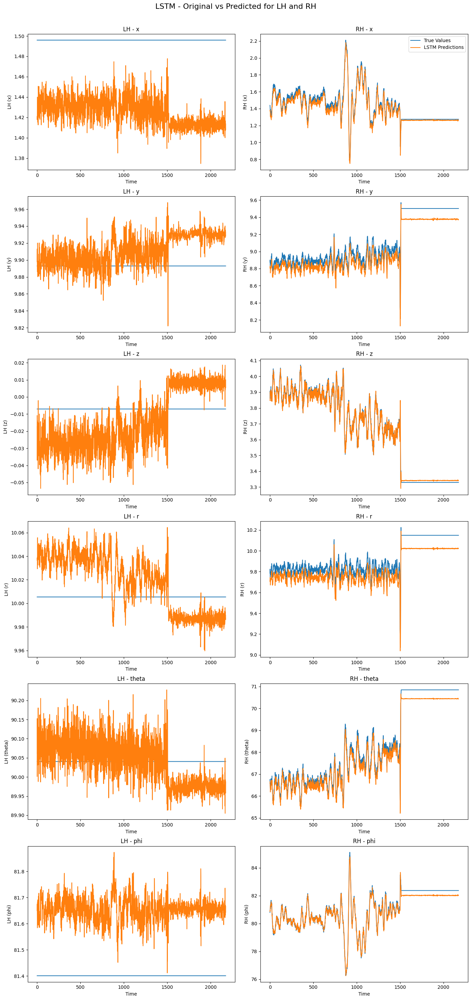

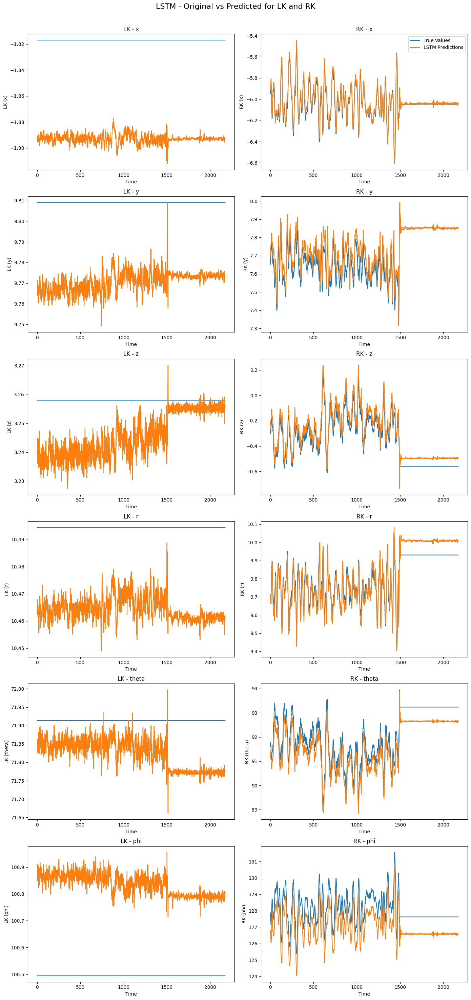

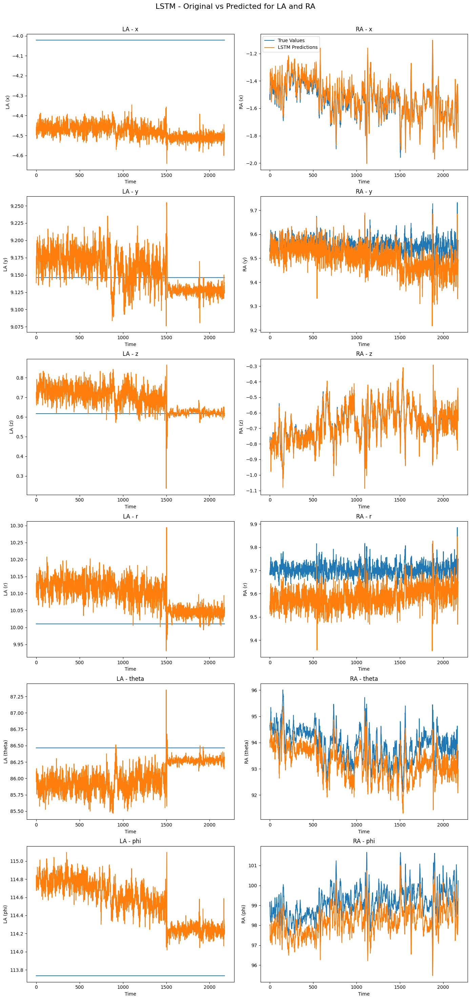

Generating plots for 1D CNN...


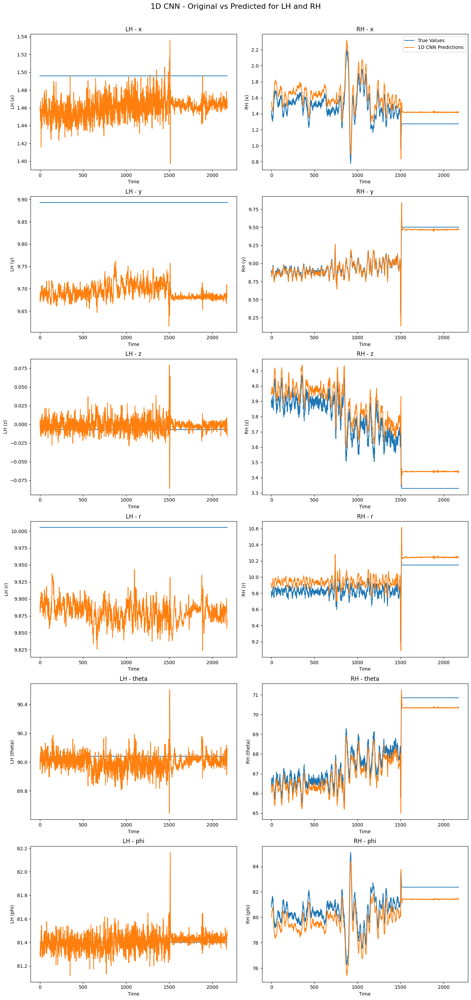

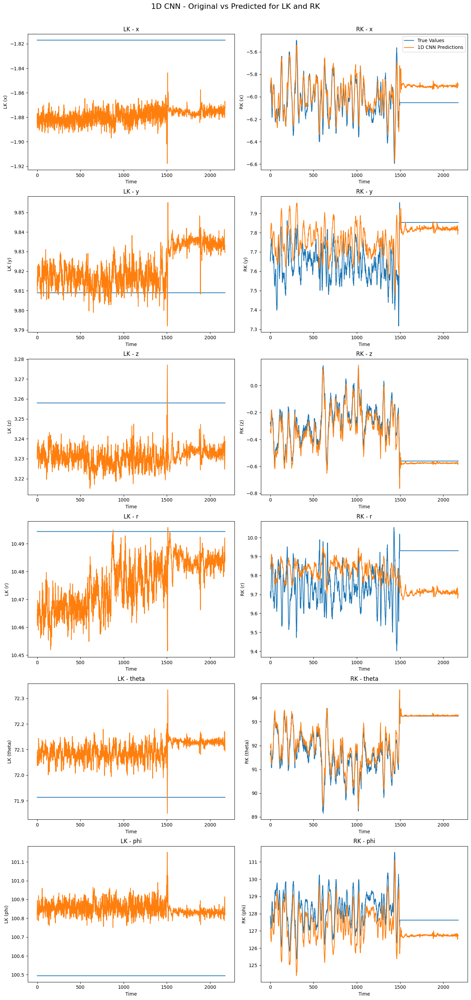

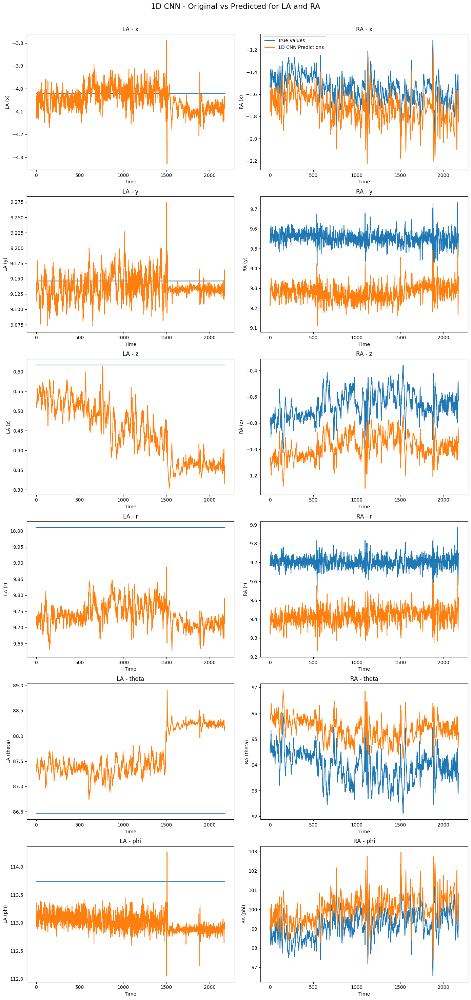

Generating plots for Hybrid CNN-LSTM...


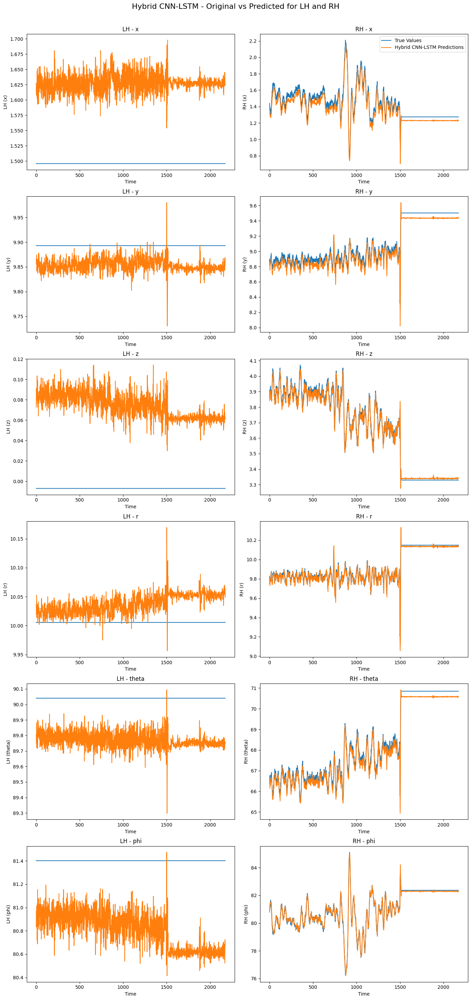

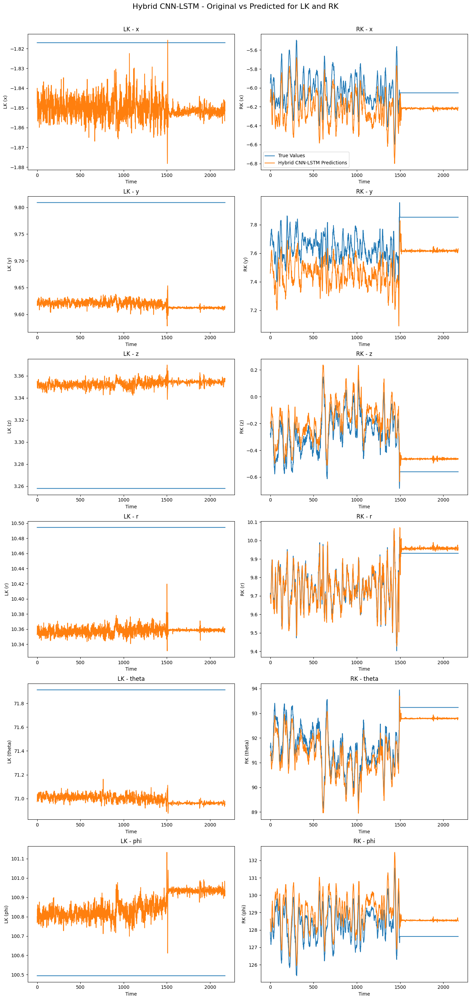

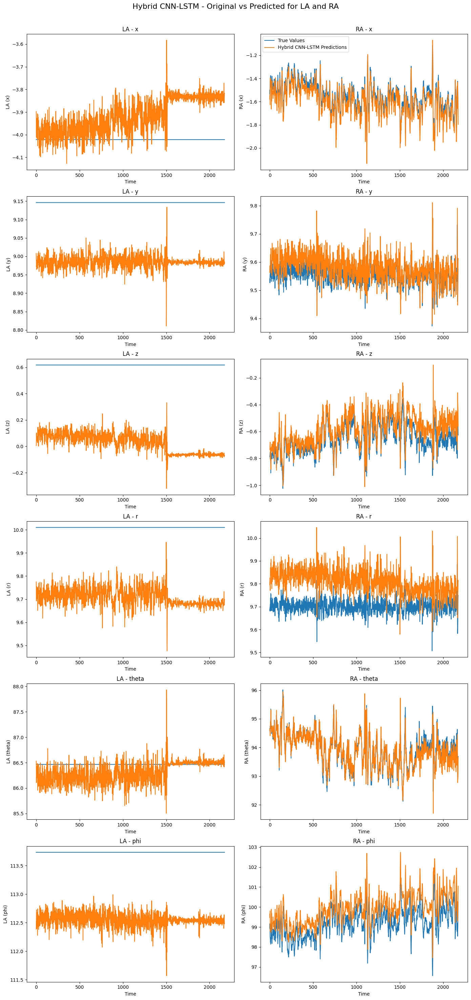

Generating plots for Bidirectional LSTM...


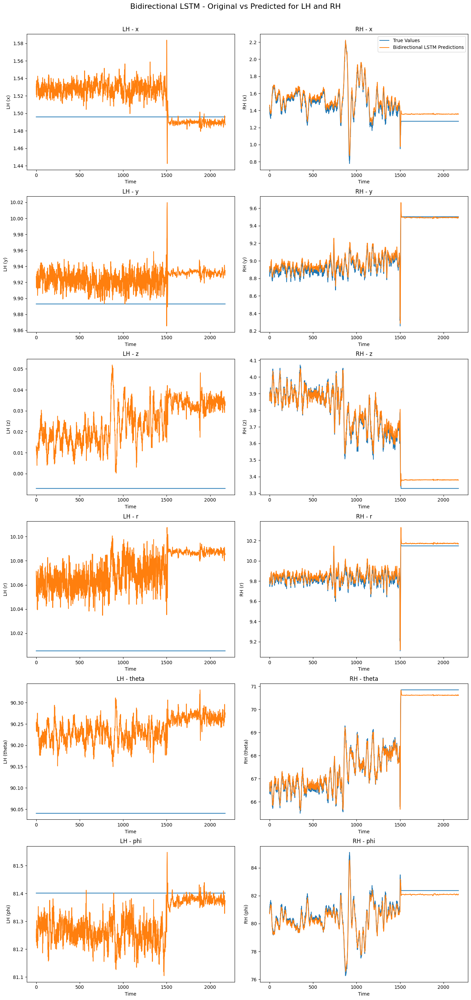

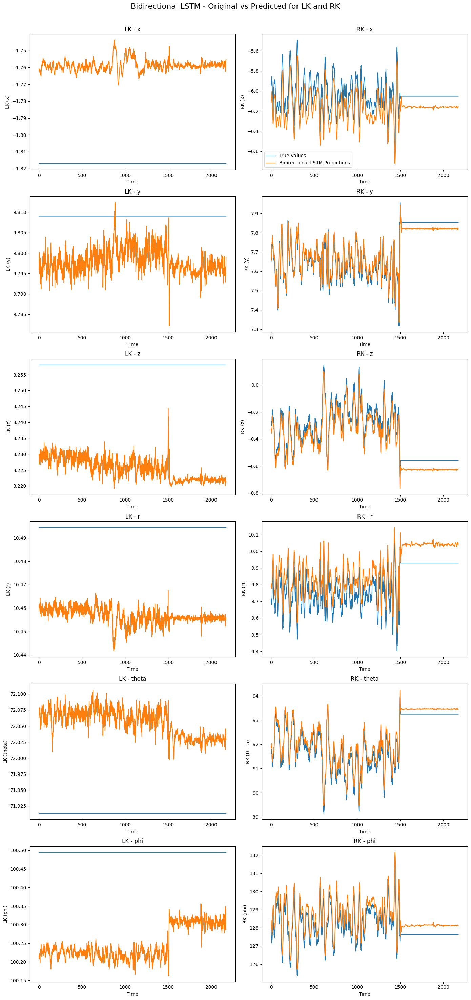

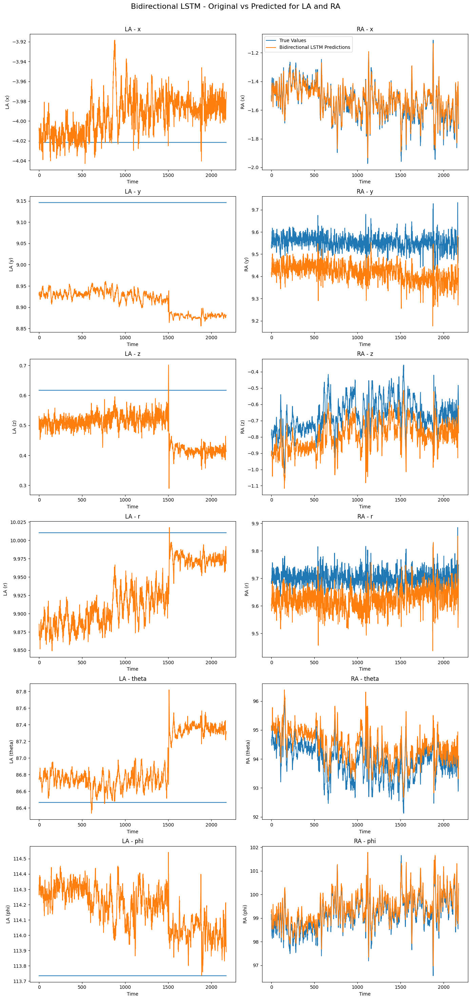

Generating plots for GRU...


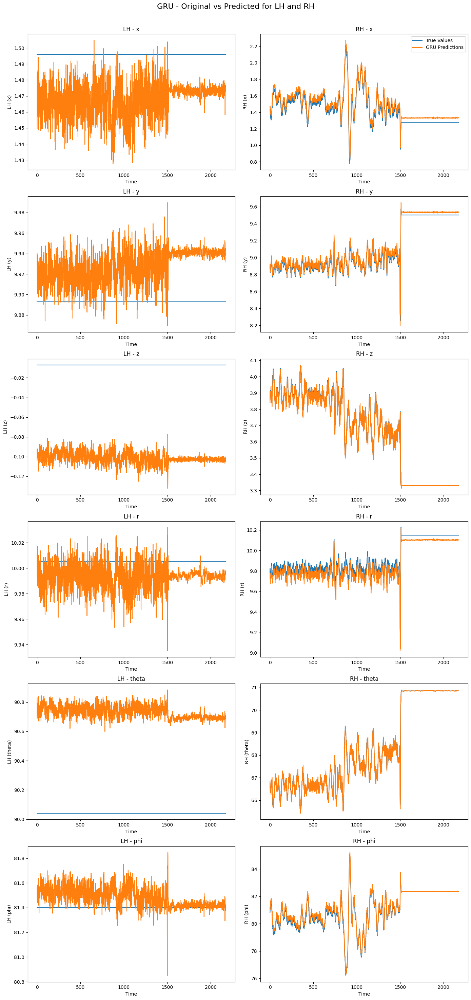

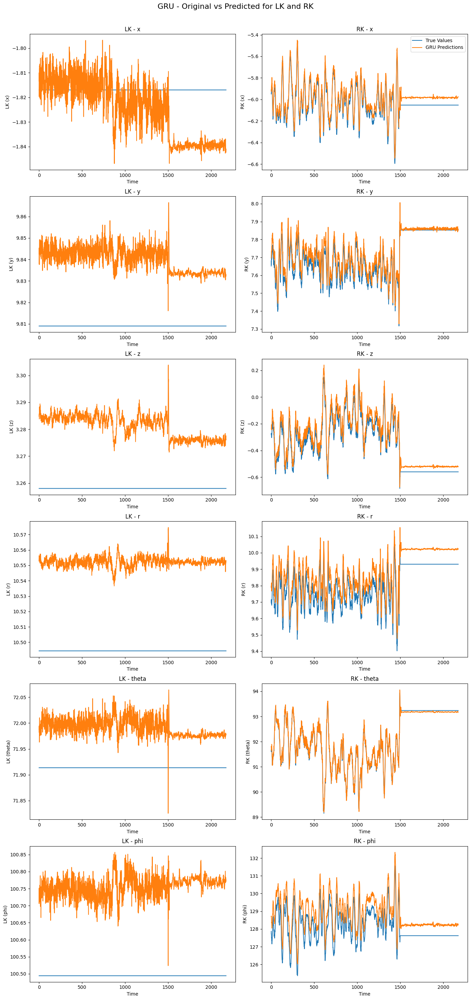

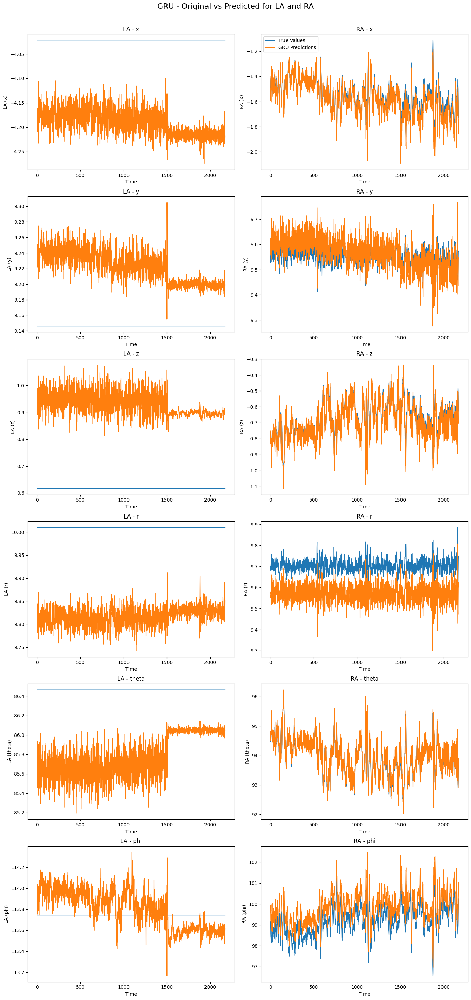

Generating plots for ConvLSTM...


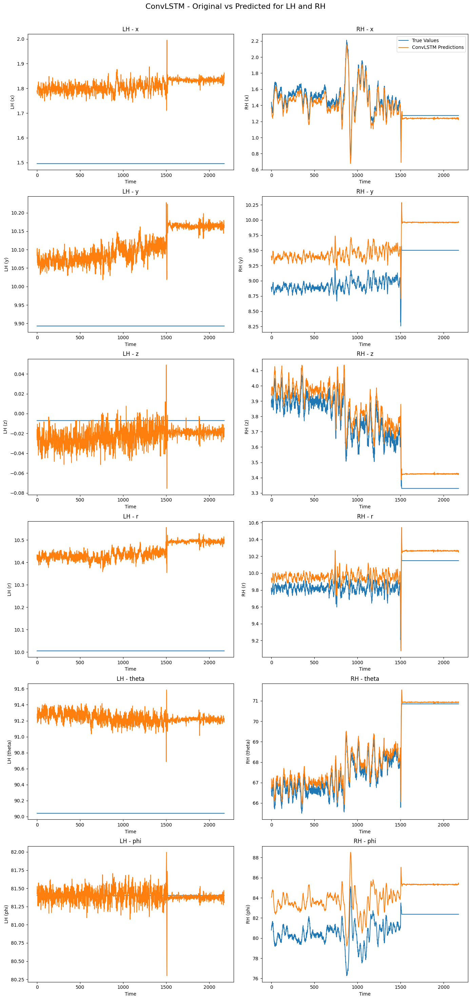

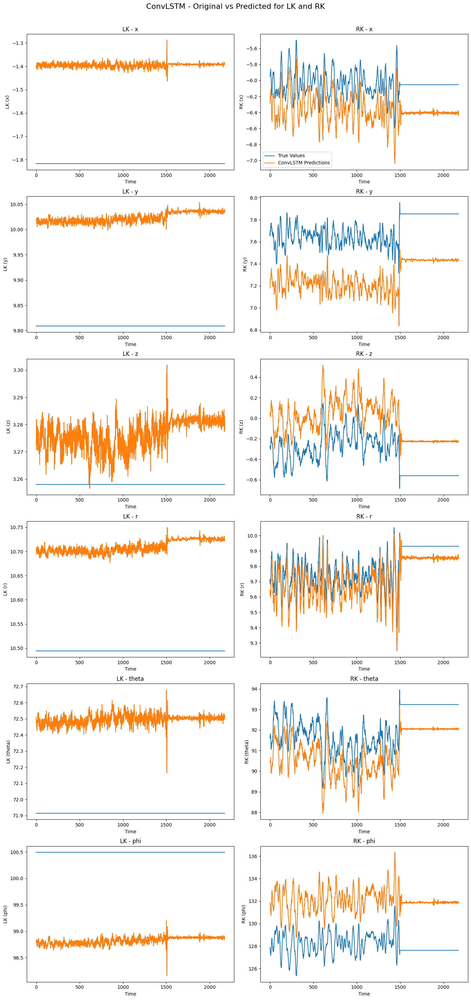

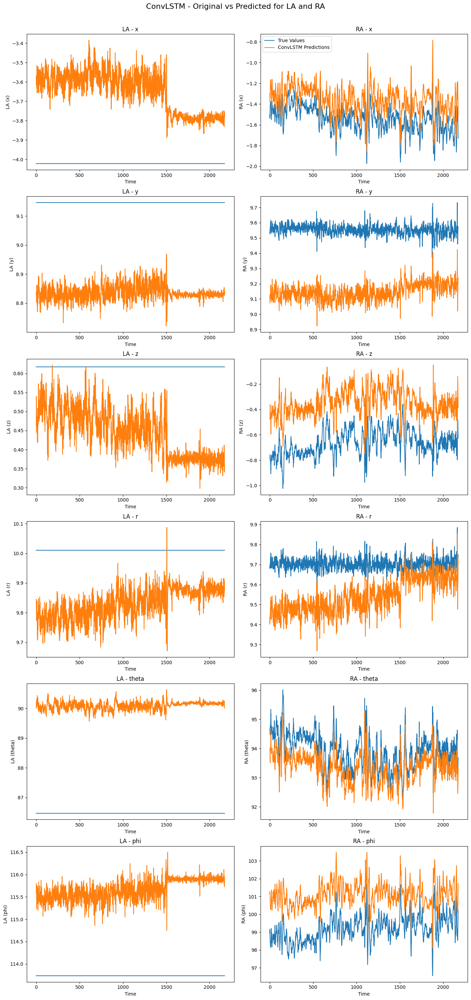

Generating plots for LSTM with Attention...


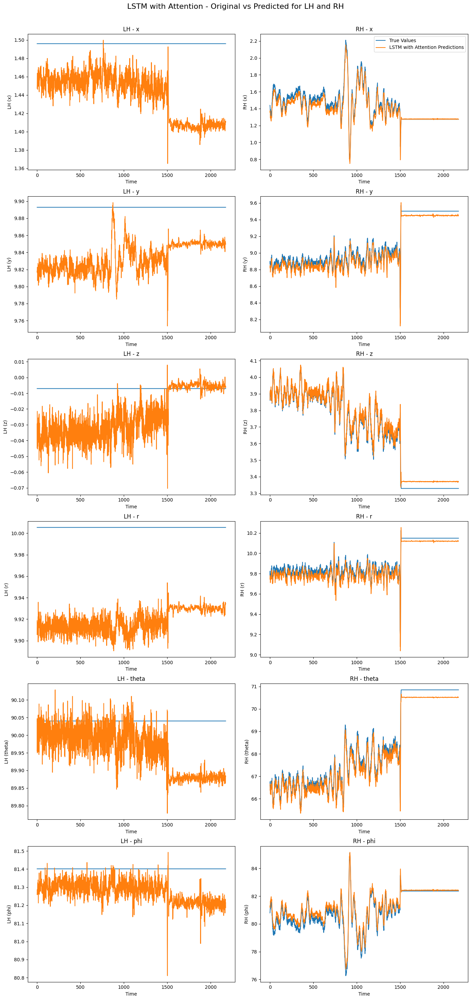

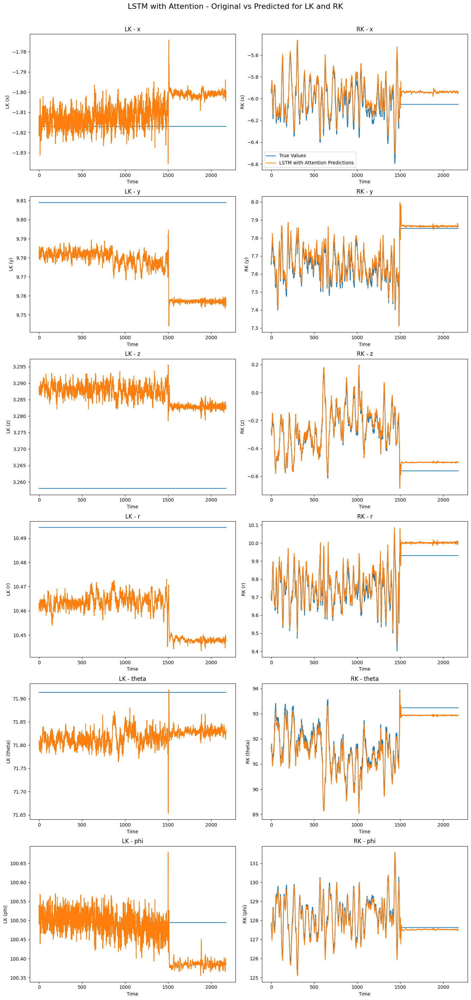

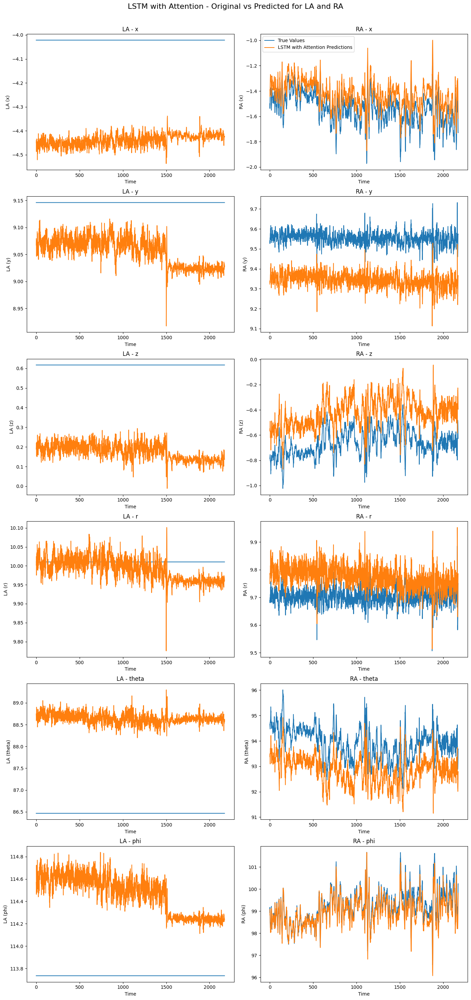

In [22]:
import matplotlib.pyplot as plt

# Function to plot predictions for different joints for a specific model, plotting only the first 100 values
def plot_joint_predictions_for_model(predictions, y_test_inverse, model_name, feature_names):
    """
    predictions: Predictions from a specific model (e.g. lstm_predictions, cnn_predictions, etc.)
    y_test_inverse: Inverse transformed ground truth values for testing data
    model_name: Name of the model (e.g. 'LSTM', 'CNN', etc.)
    feature_names: List of feature names (e.g. ['X_LH', 'Y_LH', 'Z_LH', 'R_LH', 'Theta_LH', 'Phi_LH', ...])
    """
    
    # Define joint pairs and their corresponding feature indices
    joint_pairs = [['LH', 'RH'], ['LK', 'RK'], ['LA', 'RA']]  # Columns for each figure
    feature_indices = {
        'LH': [0, 1, 2, 3, 4, 5],  # Indices for features belonging to LH (adjust these indices)
        'RH': [6, 7, 8, 9, 10, 11],
        'LK': [12, 13, 14, 15, 16, 17],
        'RK': [18, 19, 20, 21, 22, 23],
        'LA': [24, 25, 26, 27, 28, 29],
        'RA': [30, 31, 32, 33, 34, 35],
    }
    
    # Generate 3 figures for each model
    for i, joint_pair in enumerate(joint_pairs):
        fig, axes = plt.subplots(6, 2, figsize=(14, 30))  # 6 rows for parameters, 2 columns for each joint in the pair
        fig.suptitle(f'{model_name} - Original vs Predicted for {joint_pair[0]} and {joint_pair[1]}', fontsize=16)

        for row in range(6):  # 6 parameters (x, y, z, r, theta, phi)
            for col, joint in enumerate(joint_pair):  # LH or RH, LK or RK, etc.
                feature_index = feature_indices[joint][row]  # Get the correct feature index for this joint and parameter
                ax = axes[row, col]

                # Plot true values and predictions (only first 100 values)
                ax.plot(y_test_inverse[:, feature_index], label='True Values')
                ax.plot(predictions[:, feature_index], label=f'{model_name} Predictions')
                ax.set_title(f'{joint} - {feature_names[row]}')
                ax.set_xlabel('Time')
                ax.set_ylabel(f'{joint} ({feature_names[row]})')

                if row == 0 and col == 1:
                    ax.legend()

        plt.tight_layout()
        plt.subplots_adjust(top=0.95)  # Adjust the top to make room for the title
        plt.show()

# Function to call plot generation for each model
def generate_plots_for_each_model(models_predictions, y_test_inverse, model_names, feature_names):
    """
    models_predictions: List of predictions from different models (e.g. [lstm_predictions, cnn_predictions, ...])
    y_test_inverse: Inverse transformed ground truth values for testing data
    model_names: List of model names corresponding to the predictions
    feature_names: List of feature names (e.g. ['x', 'y', 'z', 'r', 'theta', 'phi'])
    """
    for i, model_predictions in enumerate(models_predictions):
        model_name = model_names[i]
        print(f'Generating plots for {model_name}...')
        plot_joint_predictions_for_model(model_predictions, y_test_inverse, model_name, feature_names)

# Example usage with all models
models_predictions = [lstm_predictions, cnn_predictions, cnn_lstm_predictions, bidirectional_lstm_predictions, gru_predictions, convlstm_predictions, lstm_attention_predictions]
model_names = ['LSTM', '1D CNN', 'Hybrid CNN-LSTM', 'Bidirectional LSTM', 'GRU', 'ConvLSTM', 'LSTM with Attention']
feature_names = ['x', 'y', 'z', 'r', 'theta', 'phi']  # These are the 6 parameters

# Generate the plots for each model (plotting only the first 100 values)
generate_plots_for_each_model(models_predictions, y_test_inverse, model_names, feature_names)
